# Blade Perturbation

This notebook demonstrates the blade perturbation capability of [G2Aero](https://github.com/NREL/G2Aero). An executable script version can be found in `examples/perturb_blade.py`.

In [1]:
import os
import numpy as np
# G2Aero
from g2aero.PGA import PGAspace
from g2aero.utils import position_airfoil
from g2aero.yaml_info import YamlInfo
from g2aero.Grassmann_interpolation import GrassmannInterpolator
from g2aero.transform import TransformBlade, global_blade_coordinates
from g2aero.SPD import polar_decomposition
# Plotting
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

## Define the data-driven domain
We begin by loading the dataset of airfoils from the file and construct a 4-dimensional PGA space by setting `n_modes=4`. In general, `n_modes` can be any number less then `2*(n_landmarks - 2)`. See [Data-Driven Domain of Shapes](https://g2aero.readthedocs.io/en/latest/how_to_guides/files/0_Data-Driven_Domain.html#) for more details about defining a domain from data.

In [2]:
# Load shapes from the dataset
shapes_file = os.path.join(os.getcwd(), '../../data/airfoils', 'CST_shapes_TE_gap.npz')
shapes = np.load(shapes_file)['shapes']
n_landmarks = shapes.shape[1]

#### PGA space
pga, t = PGAspace.create_from_dataset(shapes, n_modes=4)
pga.radius /= 2  #set sampling radius

Karcher mean convergence:
||V||_F = 0.10235806971182136
||V||_F = 0.00015526889897766333
||V||_F = 2.711475818217379e-07
||V||_F = 5.985411577115823e-10


Alternatively, we can use a saved parameter space (PGA space) by loading data from the `../../data/pga_space` subdirectory. To visualize this parameter space, we plot a matrix scatter plot to view marginal slices through the data as processed in a [Data-Driven Domain of Shapes](https://g2aero.readthedocs.io/en/latest/how_to_guides/files/0_Data-Driven_Domain.html#).

In [3]:
# pga_dict = np.load(os.path.join(os.getcwd(), '../../data/pga_space/PGA_space.npz'))
# pga = PGAspace(pga_dict['Vh'], pga_dict['M_mean'], pga_dict['b_mean'], pga_dict['karcher_mean'])
# t = np.load(os.path.join(os.getcwd(), '../../data/pga_space/', 't.npz'))['t']
# # for sampling 
# pga.axis_min, pga.axis_max = np.min(t, axis=0),  np.max(t, axis=0)
# r_min, r_max = np.abs(np.quantile(t, 0.0, axis=0)), np.abs(np.quantile(t, 0.0, axis=0))
# pga.radius = np.max(np.array([r_min, r_max]), axis=0)

## Load blade definition from YAML file
Note, in this example, we only utilize cross sections starting from the third index, `Blade.xy_landmarks[2:]`, since the first two cross sections are defined as circles to meet structural requirements and we do not wish to perturb them. This is common for the vast majority of wind-turbine blade definitions but may not be the case for aircraft wings. Double check your definition of `shapes_bs` before implementing scripts.

In [4]:
blade_filename = 'IEA-15-240-RWT.yaml' # or 'nrel5mw_ofpolars.yaml'
shapes_path = os.path.join(os.getcwd(), '../../data/blades_yamls', blade_filename)

Blade = YamlInfo(shapes_path, n_landmarks=n_landmarks, landmark_method='cst')
M_yaml = Blade.M_yaml_interpolator
b_yaml = Blade.b_yaml_interpolator
b_pitch = Blade.pitch_axis

shapes_bs = Blade.xy_landmarks[2:] # given (baseline) blade airfoils

# Uncomment if dataset doesn't have TE gaps
# # remove gap from nominal shapes
# shapes_bs = np.empty_like(Blade.xy_landmarks)
# for i, xy in enumerate(Blade.xy_landmarks):
#     nogap_shapes[i] = remove_tailedge_gap(xy)

## Generate perturbation
Next, we need to get LA-standardized shapes for baseline blade airfoils. We accomplish this using the polar decomposition.

In [5]:
shapes_gr_bs, M_bs, b_bs = polar_decomposition(shapes_bs)

Now we can use these standardized shapes to generate perturbations. As an example, let's generate `N=2` consistent perturbations to the blade. 

The method generates a pertubation vector `coef` and consistently perturbs each cross section of the blade using parallel transport. The returned arrays `new_shapes` and `coef` have shapes `(N, n_shapes_in_blade, n_landmarks, 2)` and `(N, n_modes)`, respectively. 

Note that the pertubation vector is generated randomly in the routine `pga.generate_perturbed_blade` based on a uniform measure over a ball containing the data. Despite this, the routine can perturb the blade such that some perturbed cross sections self-intersect based on a simplified criteria we have for detecting piecewise linear self-intersection. If this happens, a new perturbation vector is automatically generated and the routine attempts to build another perturbation with a new randomly generated `coef` vector. Regardless, each row of the `coef` array corresponds to the succesfully generated blade returned from the routine.

In [12]:
N = 2
new_blades, coef = pga.generate_perturbed_blade(shapes_gr_bs, n=N)
print(f'\nnew_blades shape: {new_blades.shape}')
print(f'coef shape: {coef.shape}')

Perturbing blade 1
Generating new coef
Generating new coef
Perturbing blade 2
Generating new coef

new_blades shape: (2, 8, 401, 2)
coef shape: (2, 4)


To visualize the consistent perturbation to the blade and augment the human interpretable notion of consistency, we plot the nominal (baseline) airfoils compared to the consistently perturbed cross sections. Notice that although the airfoils are distinct, they are deformed in a markedly similar manner.

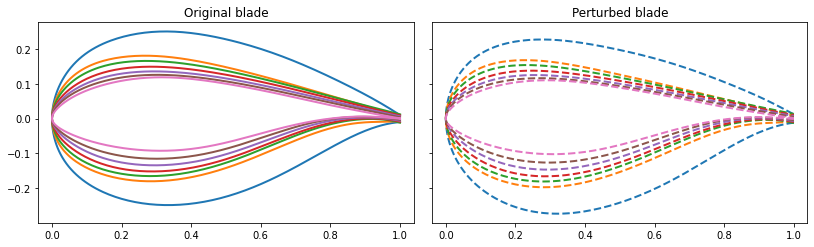

In [14]:
fig, ax = plt.subplots(1, 2, figsize=(12, 3.2), sharey='row')
for i, (shape, new, m) in enumerate(zip(shapes_gr_bs[:-1], new_blades[0, :-1], M_bs[:-1])):
    old_phys = position_airfoil(shape@m)
    new_phys = position_airfoil(new@m)
    ax[0].plot(old_phys[:, 0], old_phys[:, 1], lw=2); 
    ax[1].plot(new_phys[:, 0], new_phys[ :, 1], ls='--', lw=2)
ax[0].set_title('Original blade')
ax[1].set_title('Perturbed blade')
ax[0].axis('equal')
ax[1].axis('equal')
fig.subplots_adjust(left=0.1, right=0.99, bottom=0.12, top=0.99, wspace=0.05)

Another way to visualize perturbations is to plot the perturbed and original blade in PGA coordinates. Below we show the matrix scatter plot of the data used to infer the PGA space. Overlaid in these plots is a solid line represents the original blade interpolation visualized over PGA coordinates. Each baseline airfoil is a point in PGA space shown as a `+` marker while the dashed line represents a (consistently) randomly perturbed blade.

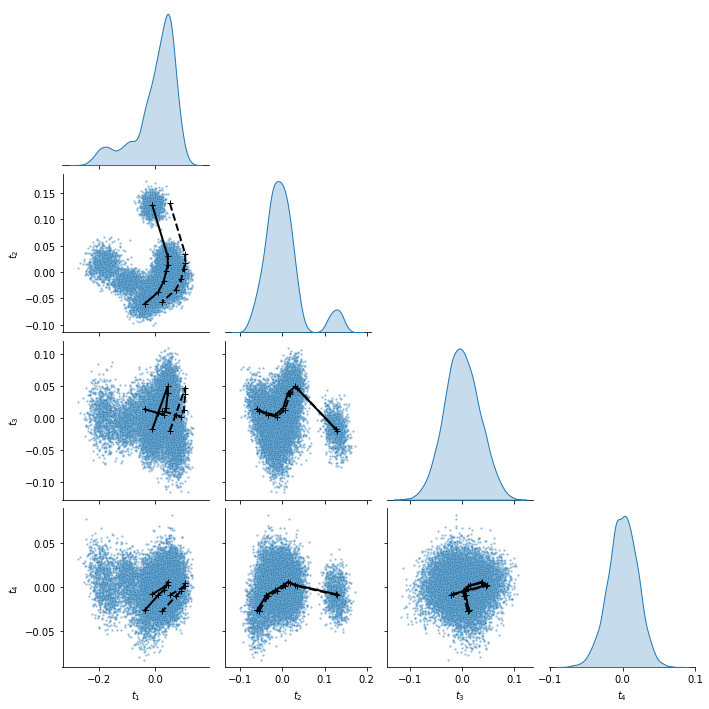

In [15]:
import sys
sys.path.insert(0, '../')
from plot_helpfunctions import scatterplot_with_blades

blade_pga = pga.gr_shapes2PGA(shapes_gr_bs)
blade_new_pga = pga.gr_shapes2PGA(new_blades[0])
scatterplot_with_blades(t, [blade_pga, blade_new_pga])

## Interpolate perturbed blade

Next, we apply affine deformations to scale airfoils in a physically meaningful way to define realistically scaled cross sections of the blade similar to those read from a blade YAML file definition. Additionally, we add hub circles back to the interpolation of the perturbed blade for the case of working with wind-turbine data. 

In [16]:
# Inverse affine transform (just for one blade)
new_blade_phys = np.empty_like(new_blades[0])
for i, sh in enumerate(new_blades[0]):
    new_blade_phys[i] = sh @ M_bs[i] + b_bs[i]

# Add circles
new_blade_full = np.vstack((Blade.xy_landmarks[:2], new_blade_phys))

Lastly, we generate a refined blade interpolation based on the Grassmannian Interpolation class. (See [Grassmannian Interpolation](https://g2aero.readthedocs.io/en/latest/how_to_guides/files/3_How_to_interpolate.html) for more details.)

In [17]:
GrInterp = GrassmannInterpolator(Blade.eta_nominal, new_blade_full) 
eta_span = GrInterp.sample_eta(100, n_hub=10, n_tip=10, n_end=25)
_, blade_gr = GrInterp(eta_span, grassmann=True)
Transform = TransformBlade(Blade.M_yaml_interpolator, Blade.b_yaml_interpolator, 
                           Blade.pitch_axis, GrInterp.interpolator_M, GrInterp.interpolator_b)
xyz_local = Transform.grassmann_to_phys(blade_gr, eta_span)
xyz_global = global_blade_coordinates(xyz_local)

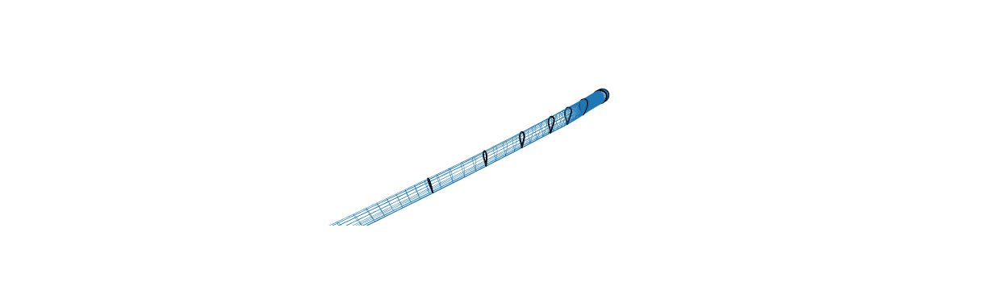

In [18]:
from plot_helpfunctions import plot_3d_blade

nominal_shapes = global_blade_coordinates(Transform.grassmann_to_phys(GrInterp.xy_grassmann, GrInterp.eta_nominal))
plot_3d_blade(xyz_global, nominal_shapes)